<a href="https://colab.research.google.com/github/tmq24/Digital-Image-Analysis-and-Processing/blob/main/%20bandpass_and_bandreject_filters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Application of Fourier Transform in Digital Image Processing: Part 2**

In [ ]:
!pip install PyWavelets

In [ ]:
import numpy as np
import pandas as pd
import cv2
import pywt
import os
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
import gdown

In [ ]:
gdown.download('https://drive.google.com/uc?export=download&id=1JDHHv5RED6cvOHuJKq_MPV2ftV2aTlar', 'brandenburg.jpg', quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&id=1JDHHv5RED6cvOHuJKq_MPV2ftV2aTlar
To: /content/brandenburg.jpg
100%|██████████| 24.8k/24.8k [00:00<00:00, 37.2MB/s]


'brandenburg.jpg'

In [ ]:
fil_path = '/content'  # Base directory path for image files
imgbridge = 'brandenburg.jpg'  # Filename of the bridge image

In [ ]:
def Image3Dto2D(image):
    """
    Convert a 3D image (color) to a 2D image (grayscale).

    Parameters:
        image (ndarray): Input image, which can be 2D (grayscale) or 3D (color).

    Returns:
        image_2D (ndarray): Grayscale image as a 2D array.
    """
    # Check if the image has at least 3 dimensions (color image)
    if len(image.shape) >= 3:
        # Convert the 3D color image to grayscale using OpenCV's cvtColor function
        image_2D = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        # If the image is already 2D (grayscale), create a copy of it
        image_2D = image.copy()

    return image_2D

In [ ]:
def ShowImage(ImageList, nRows=1, nCols=2, WidthSpace=0.00, HeightSpace=0.00):
    """
    Display a list of images in a grid layout using Matplotlib.

    Parameters:
        ImageList (list): List of images to be displayed.
        nRows (int): Number of rows in the grid layout. Default is 1.
        nCols (int): Number of columns in the grid layout. Default is 2.
        WidthSpace (float): Horizontal space between grid cells. Default is 0.00.
        HeightSpace (float): Vertical space between grid cells. Default is 0.00.
    """
    # Initialize a GridSpec object for the grid layout with specified rows and columns
    gs = gridspec.GridSpec(nRows, nCols)

    # Update the grid spacing with the provided width and height spacing
    gs.update(wspace=WidthSpace, hspace=HeightSpace)  # Adjust spacing between plots.

    # Set the figure size
    plt.figure(figsize=(20, 10))

    # Loop through the list of images
    for i in range(len(ImageList)):
        # Create a subplot for the current image using GridSpec
        ax1 = plt.subplot(gs[i])

        # Remove tick labels for a cleaner display
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])

        # Set the aspect ratio to 'equal' to preserve image dimensions
        ax1.set_aspect('equal')

        # Create another subplot using standard indexing
        plt.subplot(nRows, nCols, i + 1)

        # Copy the image to avoid modifying the original
        image = ImageList[i].copy()

        # Check if the image is grayscale (2D array)
        if len(image.shape) < 3:
            # Display grayscale image using the appropriate colormap
            plt.imshow(image, plt.cm.gray)
        else:
            # Display color image
            plt.imshow(image)

        # Add a title to the image, e.g., "Image 0", "Image 1", etc.
        plt.title("Image " + str(i))

        # Turn off axes for a cleaner display
        plt.axis('off')

    # Show all the images
    plt.show()


In [ ]:
def DFT_Transformation(image):
    """
    Perform Discrete Fourier Transform (DFT) on an image and compute its magnitude spectrum.

    Parameters:
        image (ndarray): Input image, can be 2D (grayscale) or 3D (color).

    Returns:
        magnitude_spectrum (ndarray): The magnitude spectrum of the transformed image.
        dft_shift (ndarray): The shifted DFT result (frequency domain representation).
    """
    # Convert the image to 2D grayscale if it is a color image
    img = Image3Dto2D(image)

    # Convert the image to float32 format (required for DFT)
    img_float32 = np.float32(img)

    # Apply Discrete Fourier Transform (DFT) to the image
    dft = cv2.dft(img_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center of the frequency domain
    dft_shift = np.fft.fftshift(dft)

    # Compute the magnitude spectrum (log-scaled for visualization)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    return magnitude_spectrum, dft_shift


In [ ]:
def InverseDFTWithMask(dft_shift, mask):
    """
    Apply a mask to the frequency domain representation of an image and perform an inverse DFT.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        mask (ndarray): The mask to apply in the frequency domain.

    Returns:
        image_inverse (ndarray): The reconstructed image in the spatial domain after applying the mask.
    """
    # Apply the mask to the frequency domain representation
    fshift = dft_shift * mask

    # Perform an inverse shift to move the zero-frequency component back to its original position
    f_ishift = np.fft.ifftshift(fshift)

    # Perform the inverse Discrete Fourier Transform (IDFT)
    img_inverse = cv2.idft(f_ishift)

    # Compute the magnitude of the spatial domain representation
    image_inverse = cv2.magnitude(img_inverse[:, :, 0], img_inverse[:, :, 1])

    return image_inverse

In [ ]:
def get_actual_file_size(image_path):
    """
    Get the actual file size of the image stored on the disk.

    Args:
        image_path (str): The path to the image file.

    Returns:
        float: The actual file size (in KB).
    """
    file_size = os.path.getsize(image_path)  # Get the file size on disk (in bytes)
    return f"The actual file size is: {file_size / 1024 :.2f} KB" # Convert to KB

In [ ]:
# Read Image
image_color = imread(imgbridge)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

In [ ]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)

##Bandreject and Bandpass filters in image processing

###Bandpass filters

In [ ]:
def ApplyCenterSquareMasMasKBandPass(dft_shift, size_small,size_big,dim):
    """
    Apply a center square mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        size (int): Half the side length of the square mask to be applied.

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Set a center square to 1
    mask_lowpass = mask.copy()
    mask_lowpass[crow - size_small:crow + size_small, ccol - size_small:ccol + size_small] = 1
    mask_centralpass = mask.copy()
    mask_centralpass[crow - size_small - size_big:crow + size_small + size_big,ccol - size_small - size_big:ccol + size_small + size_big] = 1
    maskbandpass = mask_centralpass - mask_lowpass

    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * maskbandpass[:,:,dim]

    return masked_dft_shift, maskbandpass

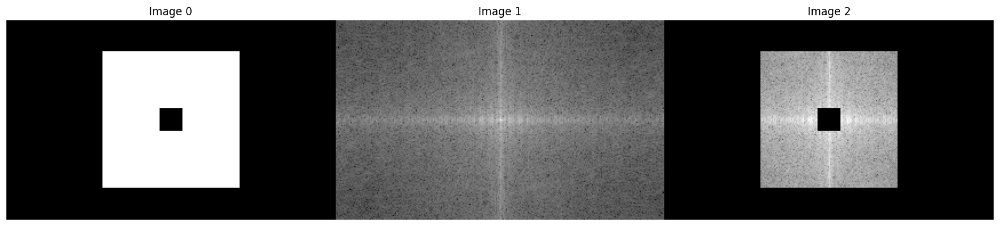

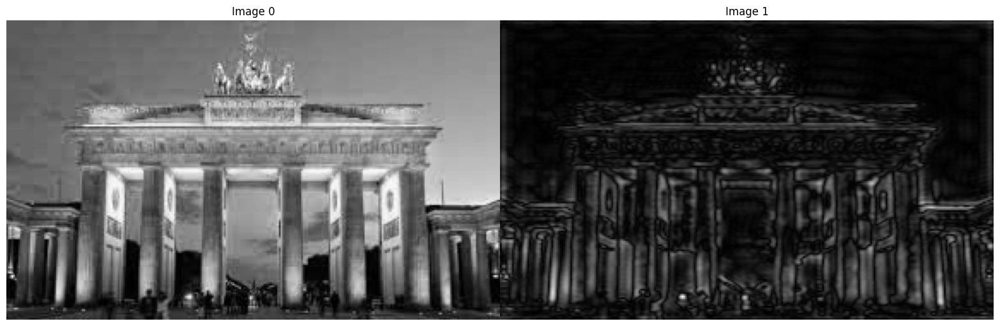

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros

image_dft_frequency_crop,maskbandreject = ApplyCenterSquareMasMasKBandPass(image_dft_frequency,size_small = 10,size_big=50,dim = 0)

# apply mask and inverse DFT

image_inverse = InverseDFTWithMask(dft_shift, maskbandreject)

ShowImage([maskbandreject[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

###Bandreject filters

In [ ]:
def ApplyCenterSquareMasKBandReject(dft_shift,size_small,size_big,dim):
    """
    Apply a center square mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        size (int): Half the side length of the square mask to be applied.

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask_universe = np.ones((rows, cols, 2), np.uint8)
    # Set a center square to 1
    mask_lowpass = mask.copy()
    mask_lowpass[crow - size_small:crow + size_small, ccol - size_small:ccol + size_small] = 1
    mask_centralpass = mask.copy()
    mask_centralpass[crow - size_small - size_big:crow + size_small + size_big,ccol - size_small - size_big:ccol + size_small + size_big] = 1
    maskbandpass = mask_centralpass - mask_lowpass
    maskbandreject = mask_universe - maskbandpass
    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * maskbandreject[:,:,dim]

    return masked_dft_shift, maskbandreject

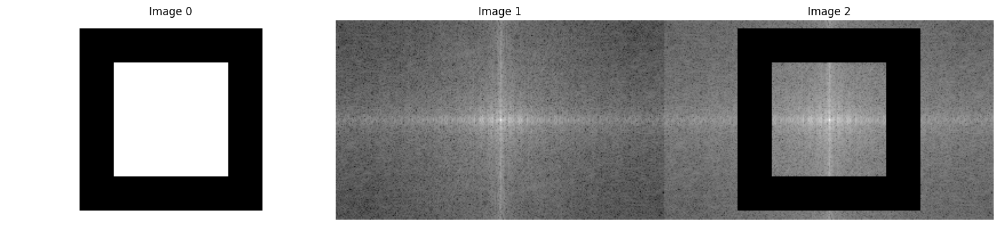

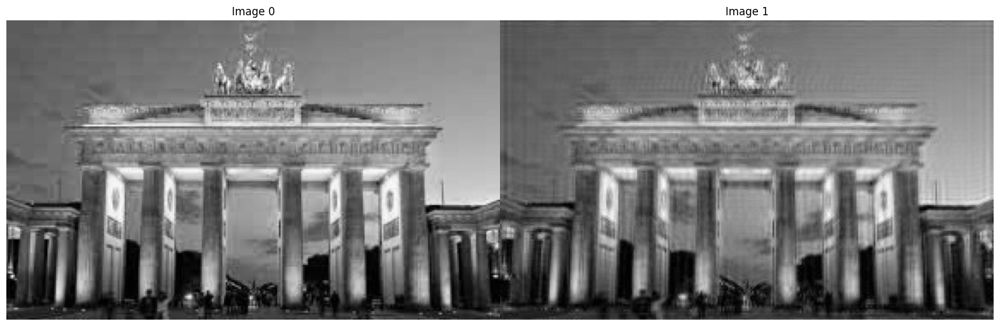

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros

image_dft_frequency_crop,maskbandreject = ApplyCenterSquareMasKBandReject(image_dft_frequency,size_small = 50,size_big=30,dim = 0)

# apply mask and inverse DFT

image_inverse = InverseDFTWithMask(dft_shift, maskbandreject)

ShowImage([maskbandreject[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

##Exploring Image Compression with Fourier Tranform and Wavelet Traform

###Fourier Tranform

Fourier Transform decomposes an image into its frequency components. High-frequency components, representing details and edges, can be reduced without losing significant information.

In [ ]:
def ApplyCenterSquareMask2(dft_shift, size,dim):
    """
    Apply a center square mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        size (int): Half the side length of the square mask to be applied.

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Set a center square to 1
    mask[crow - size:crow + size, ccol - size:ccol + size] = 1
    mask = 1 -mask
    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * mask[:,:,dim]

    return masked_dft_shift, mask

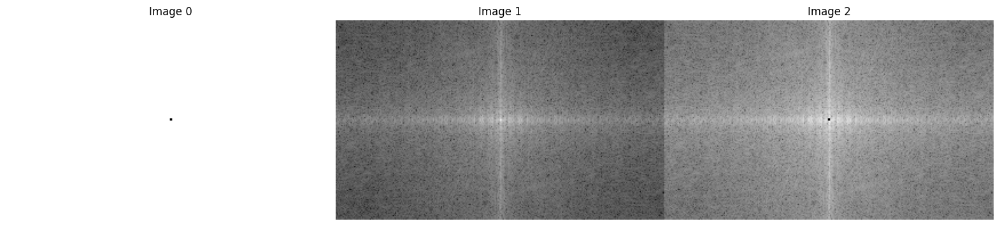

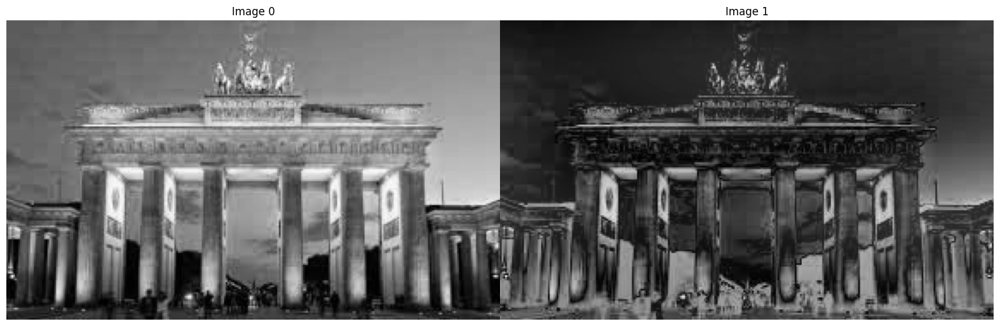

In [ ]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros

image_dft_frequency_crop,maskbandreject = ApplyCenterSquareMask2(image_dft_frequency,size = 1,dim = 0)

# apply mask and inverse DFT

image_inverse = InverseDFTWithMask(dft_shift, maskbandreject)

ShowImage([maskbandreject[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

In [ ]:
cv2.imwrite('compressed_image_Fourier.jpg', image_inverse)

True

###Wavelet Tranform

Wavelet Transform provides a multi-resolution analysis of an image. It decomposes the image into approximation and detail coefficients, allowing for efficient compression.

In [ ]:

def calculate_wavelet_coeffs(image, wavelet='bior1.3'):
    """
    Compute the wavelet coefficients using 2D Discrete Wavelet Transform (DWT2) for the input image.

    Parameters:
    - image: numpy array representing the input image.
    - wavelet: name of the wavelet to be used (default is 'bior1.3').

    Returns:
    - cA: Approximation coefficients.
    - cH: Horizontal detail coefficients.
    - cV: Vertical detail coefficients.
    - cD: Diagonal detail coefficients.
    """
    coeffs = pywt.dwt2(image, wavelet)  # Perform 2D DWT on the input image
    cA, (cH, cV, cD) = coeffs          # Decompose the coefficients into components
    return cA, cH, cV, cD              # Return the computed coefficients


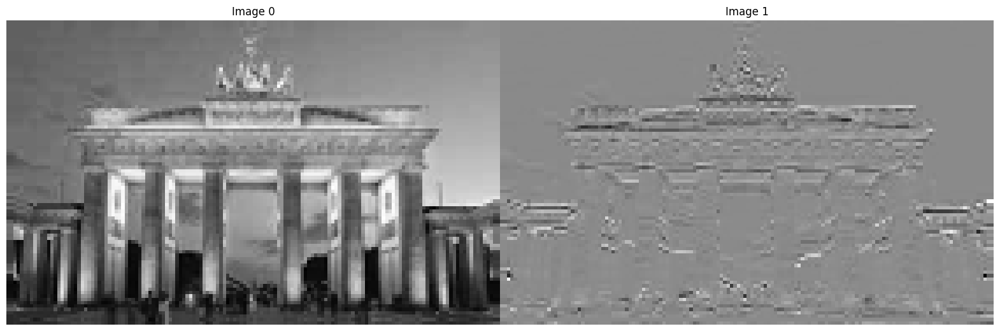

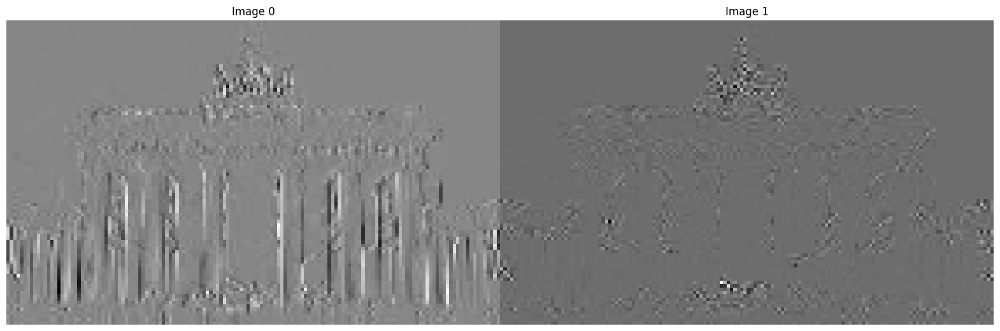

In [ ]:
cA, cH, cV, cD = calculate_wavelet_coeffs(image_gray)

ShowImage([cA, cH], 1, 2)
ShowImage([cV, cD], 1, 2)

Adjust the threshold to discard less significant coefficients and achieve compression.

In [ ]:
def compress_image_with_threshold(coeffs, threshold, wavelet='bior1.3'):
    """
    Compresses an image by applying thresholding to its wavelet coefficients.

    Parameters:
    coeffs (tuple): Wavelet coefficients of the image as (cA, (cH, cV, cD)).
    threshold (float): Thresholding limit to apply on the coefficients.
    wavelet (str): Wavelet type to use for reconstruction. Default is 'bior1.3'.

    Returns:
    numpy.ndarray: Compressed image after inverse wavelet transform.
    """
    # Unpack the wavelet coefficients
    cA, (cH, cV, cD) = coeffs

    # Apply soft thresholding to the approximation and horizontal detail coefficients
    cA_thresholded = pywt.threshold(cA, threshold, mode='soft')
    cH_thresholded = pywt.threshold(cH, threshold, mode='soft')

    # Repack the thresholded coefficients
    coeffs_thresholded = (cA_thresholded, (cH_thresholded, cV, cD))

    # Perform the inverse wavelet transform to reconstruct the compressed image
    img_compressed = pywt.idwt2(coeffs_thresholded, wavelet)

    return img_compressed

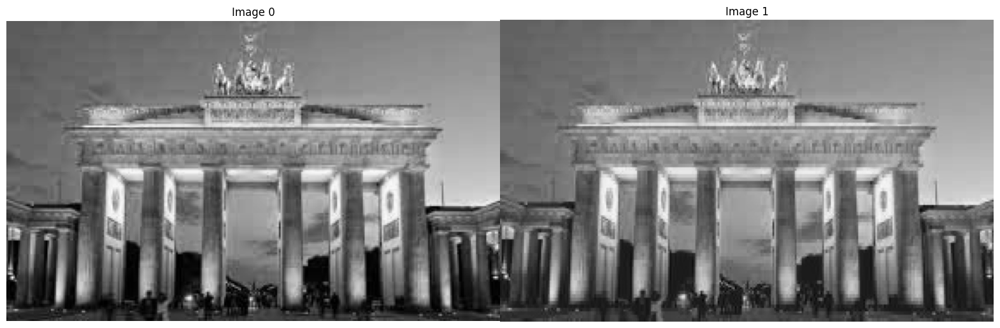

In [ ]:
compressed_image = compress_image_with_threshold(coeffs = (cA, (cH, cV, cD)), threshold = 30)
ShowImage([image_gray, compressed_image], 1, 2)

In [ ]:
cv2.imwrite('compressed_image_Wavelet.jpg', compressed_image)

True

### Result Compressed

In [ ]:
print(get_actual_file_size("brandenburg.jpg"))
print(get_actual_file_size("compressed_image_Fourier.jpg"))
print(get_actual_file_size("compressed_image_Wavelet.jpg"))

The actual file size is: 24.22 KB
The actual file size is: 0.90 KB
The actual file size is: 17.11 KB


# Exercise



---

### Theory:
1. **State the applications of bandpass and bandreject filters.**  
2. **What are the applications of bandpass and bandreject filters in machine learning?**  
3. **State the applications of wavelet transform.**  
4. **Provide a summary of the wavelet transform.**  
5. **Compare the advantages and disadvantages of wavelet transform and Fourier transform.**  

---

### Practice:
1. **Choose any image and convert it to grayscale.**  
2. **Apply a bandpass filter to the image from question 1.**  
3. **Apply a bandreject filter to the image from question 1.**  
4. **Perform image compression using Fourier transforms on the image from question 1.**  
5. **Perform image compression using wavelet transforms on the image from question 1, and compare the size with the original image and the compressed image from Fourier transform.**  
   *(Note: For questions 2–4, apply a circular mask similar to Week 5.)*

---




# Theory

## 1. **State the applications of bandpass and bandreject filters.**  

   - **Bộ lọc thông dải (bandpass):**
   
     - **Truyền thông:** Trong các hệ thống truyền thông vô tuyến, bộ lọc thông dải được sử dụng để chọn lọc các tín hiệu trong một dải tần số cụ thể, giúp giảm nhiễu và cải thiện chất lượng tín hiệu.
     
     - **Âm thanh:** Trong các hệ thống âm thanh, bộ lọc thông dải có thể được sử dụng để điều chỉnh âm sắc, ví dụ như trong các bộ điều chỉnh âm thanh (equalizer) để tăng cường hoặc giảm bớt các dải tần số nhất định.
     
     - **Y tế:** Trong các thiết bị y tế như máy đo điện tâm đồ (ECG), bộ lọc thông dải giúp loại bỏ nhiễu từ các nguồn không mong muốn, chỉ giữ lại các tín hiệu sinh học quan trọng.
     
   - **Bộ lọc chặn dải (bandreject):**
   
     - **Loại bỏ nhiễu:** Thường được sử dụng để loại bỏ các tần số nhiễu cụ thể, chẳng hạn như tiếng ồn từ nguồn điện (50/60 Hz) trong các hệ thống điện tử.
     
     - **Âm thanh:** Trong các hệ thống âm thanh, bộ lọc chặn dải có thể được sử dụng để loại bỏ các tần số gây khó chịu hoặc không mong muốn, như tiếng ồn từ quạt hoặc máy móc.

## 2. **What are the applications of bandpass and bandreject filters in machine learning?**

### **a. Data Preprocessing:**
- **Loại bỏ Nhiễu (Noise Reduction):**
  - **Mục đích:** Nhiễu có thể làm giảm độ chính xác của mô hình học máy. Bộ lọc thông dải và chặn dải giúp loại bỏ các thành phần không mong muốn trong dữ liệu.
  - **Ví dụ:** Trong phân tích tín hiệu EEG (Điện não đồ), bộ lọc thông dải có thể loại bỏ nhiễu từ các nguồn như chuyển động cơ thể hoặc nhiễu điện từ.
- **Chuẩn hóa Dữ liệu (Data Normalization):**
  - Bộ lọc có thể giúp chuẩn hóa tín hiệu bằng cách giữ lại các tần số có ý nghĩa và loại bỏ các biến động không cần thiết, giúp mô hình học máy học được các đặc trưng quan trọng hơn.

### **b. Feature Extraction:**
- **Signal Analysis:**
  - Bộ lọc thông dải và chặn dải giúp tách riêng các thành phần tần số khác nhau trong tín hiệu, từ đó trích xuất các đặc trưng đặc biệt cho mô hình học máy.
  - **Ví dụ:** Trong nhận dạng giọng nói, bộ lọc thông dải có thể giúp tách các tần số chứa thông tin ngữ âm quan trọng, cải thiện độ chính xác của mô hình nhận dạng.
- **Reducing Data Complexity:**
  - Bằng cách loại bỏ các tần số không cần thiết, bộ lọc giúp giảm số lượng đặc trưng mà mô hình cần xử lý, từ đó giảm tải tính toán và tăng hiệu suất.

### **c. Model Performance Enhancement:**
- **Accelerating Model Training:**
  - Việc giảm kích thước dữ liệu và loại bỏ các thành phần không cần thiết thông qua bộ lọc giúp tăng tốc quá trình đào tạo mô hình.
- **Improving Accuracy:**
  - Bằng cách giữ lại các tần số quan trọng và loại bỏ nhiễu, bộ lọc giúp mô hình học máy tập trung vào các đặc trưng thực sự quan trọng, từ đó cải thiện độ chính xác trong việc dự đoán và phân loại.
  

## 3. **State the applications of wavelet transform.**  

### **a. Signal Processing:**
- **Non-linear Signal Analysis:**
  - Biến đổi wavelet giúp phân tích các tín hiệu phức tạp và không tuyến, cho phép phát hiện các đặc trưng ẩn trong tín hiệu.
  - **Ví dụ:** Trong phân tích tín hiệu seismology, wavelet giúp phát hiện các sự kiện địa chấn nhỏ mà Fourier transform có thể bỏ sót.
- **Signal Filtering:**
  - Wavelet có thể được sử dụng để lọc các thành phần tần số khác nhau của tín hiệu, chẳng hạn như loại bỏ nhiễu hoặc tách các tín hiệu quan trọng.

### **b. Image Analysis and Processing:**
- **Image Compression:**
  - Biến đổi wavelet được sử dụng trong các chuẩn nén như JPEG 2000, giúp giảm kích thước tệp mà không làm mất nhiều chất lượng hình ảnh.
- **Image Reconstruction:**
  - Wavelet giúp tái tạo hình ảnh từ các phần bị mất hoặc bị hỏng, cải thiện chất lượng hình ảnh trong các ứng dụng y tế và kỹ thuật.

### **c. Detection and Recognition:**
- **Edge Detection:**
  - Wavelet giúp xác định các biên và đường viền trong hình ảnh, hỗ trợ các thuật toán nhận dạng đối tượng và phân loại.
- **Feature Recognition:**
  - Trong nhận dạng chữ viết tay hoặc ký tự, wavelet giúp trích xuất các đặc trưng đặc biệt từ hình ảnh, tăng độ chính xác của quá trình nhận dạng.

### **d. Data Compression:**
- **Audio and Video Compression:**
  - Biến đổi wavelet giúp giảm kích thước tệp âm thanh và video mà vẫn giữ được chất lượng cao, thích hợp cho các ứng dụng truyền thông và lưu trữ.
- **Medical Data Compression:**
  - Giảm kích thước dữ liệu y tế như MRI và CT scan mà không làm mất chi tiết quan trọng, hỗ trợ lưu trữ và truyền tải dữ liệu hiệu quả hơn.

## 4. **Provide a summary of the wavelet transform.**

### Phép Biến Đổi Wavelet

**Phép biến đổi wavelet** là một kỹ thuật toán học dùng để phân tích và xử lý tín hiệu. Nó phân rã tín hiệu thành các thành phần khác nhau, mỗi thành phần đại diện cho một dải tần số cụ thể.

### Điểm Nổi Bật của Phép Biến Đổi Wavelet:

1. **Phân Tích Đa Dạng Thang**:
   - Không giống như phép biến đổi Fourier chỉ cung cấp thông tin tần số của toàn bộ tín hiệu, phép biến đổi wavelet cung cấp cả thông tin thời gian và tần số, giúp phân tích hiệu quả các tín hiệu không ổn định (tín hiệu có nội dung tần số thay đổi theo thời gian).

2. **Wavelet**:
   - Wavelet là những dao động nhỏ giống sóng với thời lượng giới hạn. Chúng được sử dụng làm hàm cơ sở trong phép biến đổi wavelet.

3. **Biến Đổi Liên Tục và Rời Rạc**:
  - Phép biến đổi wavelet liên tục (CWT) phân tích tín hiệu ở mọi thang, tạo ra một phân tích chi tiết.
  Biến đổi tín hiệu thành một không gian hai chiều gồm thời gian và tần số với công thức:

  $$
  W(a, b) = \int_{-\infty}^{\infty} x(t) \psi^*_{a,b}(t) \, dt
  $$

      Trong đó:
      - $x(t)$: tín hiệu đầu vào.
      - $\psi_{a,b}(t) = \frac{1}{\sqrt{a}} \psi \left( \frac{t - b}{a} \right)$: hàm wavelet dịch chuyển ($b$) và tỉ lệ ($a$).
      - $\psi^*$: liên hợp phức của wavelet cơ sở.
      - $a > 0$: xác định độ giãn (tần số), $b$: dịch chuyển (thời gian).
   - Phép biến đổi wavelet rời rạc (DWT) sử dụng một tập hợp các thang và vị trí rời rạc, làm cho nó hiệu quả về mặt tính toán và phù hợp cho xử lý tín hiệu số.
      DWT lấy mẫu tín hiệu ở các mức tỉ lệ và dịch chuyển rời rạc, giúp giảm độ phức tạp tính toán. Công thức cơ bản:

      $$
      W(j, k) = \sum_{n} x[n] \psi^*_{j,k}[n]
      $$

      Trong đó:
      - $j$: mức tỉ lệ.
      - $k$: dịch chuyển.
      - $\psi_{j,k}$: hàm wavelet cơ sở rời rạc.

4. **Phân Rã và Tái Cấu Trúc**:
   - Tín hiệu được phân rã thành các thành phần gần đúng và chi tiết thông qua việc thu nhỏ và dịch chuyển hàm wavelet.
   - Các tín hiệu này có thể được tái cấu trúc lại thành tín hiệu gốc, cho phép giảm nhiễu và nén tín hiệu.




## 5. **Compare the advantages and disadvantages of wavelet transform and Fourier transform.**

| **Tiêu Chí**    | **Wavelet Transform** | **Fourier Transform** |
|-----------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Ưu Điểm**     | - **Phân giải đa dạng:** Cung cấp phân giải thời gian và tần số linh hoạt, thích hợp cho các tín hiệu phi tuyến và phi ổn định.<br>- **Phân tích cục bộ:** Khả năng phân tích các đặc trưng cục bộ của tín hiệu, giúp nhận diện các sự kiện ngắn hạn.<br>- **Nén dữ liệu hiệu quả:** Giữ được nhiều thông tin quan trọng trong quá trình nén.<br>- **Loại bỏ nhiễu tốt:** Phân tích đa tần số và đa thời gian giúp loại bỏ nhiễu hiệu quả. | - **Tính toán nhanh chóng:** Đặc biệt hiệu quả với thuật toán FFT, cho phép phân tích tần số nhanh chóng.<br>- **Đơn giản và dễ hiểu:** Cấu trúc toán học rõ ràng, dễ triển khai và áp dụng.<br>- **Phù hợp với tín hiệu ổn định:** Thích hợp cho các tín hiệu có tính ổn định về thời gian.<br>- **Ứng dụng rộng rãi:** Được sử dụng phổ biến trong nhiều lĩnh vực như xử lý âm thanh, hình ảnh và tín hiệu số. |
| **Nhược Điểm**  | - **Độ phức tạp tính toán cao:** Thường yêu cầu nhiều tài nguyên tính toán hơn so với biến đổi Fourier.<br>- **Chọn lựa wavelet phù hợp:** Cần lựa chọn hàm sóng cơ sở (wavelet) thích hợp cho từng ứng dụng cụ thể.<br>- **Phức tạp trong việc triển khai:** Có thể khó triển khai và hiểu đối với những người mới bắt đầu. | - **Phân giải cố định:** Cung cấp phân giải thời gian và tần số cố định, không thích hợp với các tín hiệu biến đổi theo thời gian.<br>- **Không phân tích được thông tin cục bộ:** Không thể xác định vị trí thời gian của các thành phần tần số.<br>- **Khó xử lý tín hiệu phi tuyến:** Hạn chế trong việc phân tích các tín hiệu phi tuyến và phi ổn định.<br>- **Nén dữ liệu kém hiệu quả:** Khi nén, thường mất nhiều thông tin quan trọng của tín hiệu. |



# PRACTICE

## 1. Choose any image and convert it to grayscale

Downloading...
From: https://drive.google.com/uc?id=1Gt3EaVta3Ea6NQfsaAaI7QYFaf1c9n1Z
To: /content/car.jpg
100%|██████████| 260k/260k [00:00<00:00, 6.18MB/s]


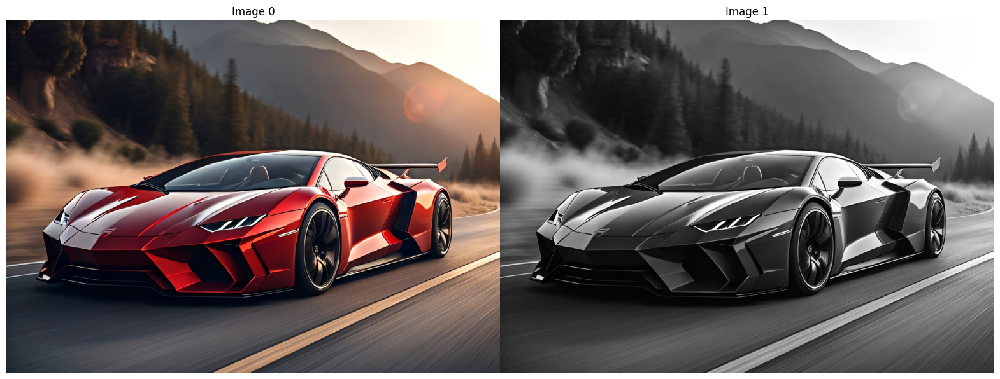

In [ ]:
gdown.download('https://drive.google.com/uc?id=1Gt3EaVta3Ea6NQfsaAaI7QYFaf1c9n1Z', 'car.jpg', quiet=False)

fil_path = '/content'
imgcar = 'car.jpg'

# Read Image
image_color = imread(imgcar)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [ ]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)

## 2. Apply a bandpass filter to the image from question

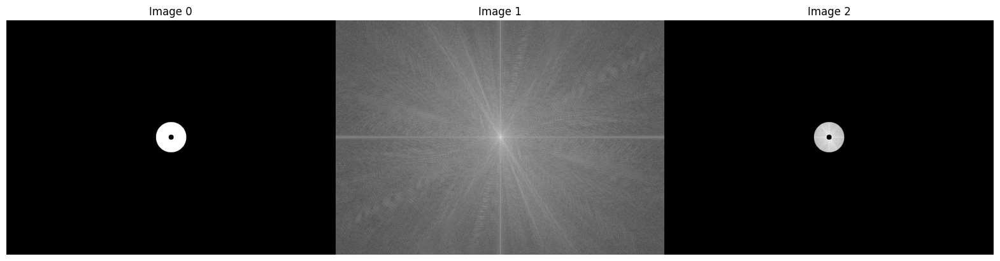

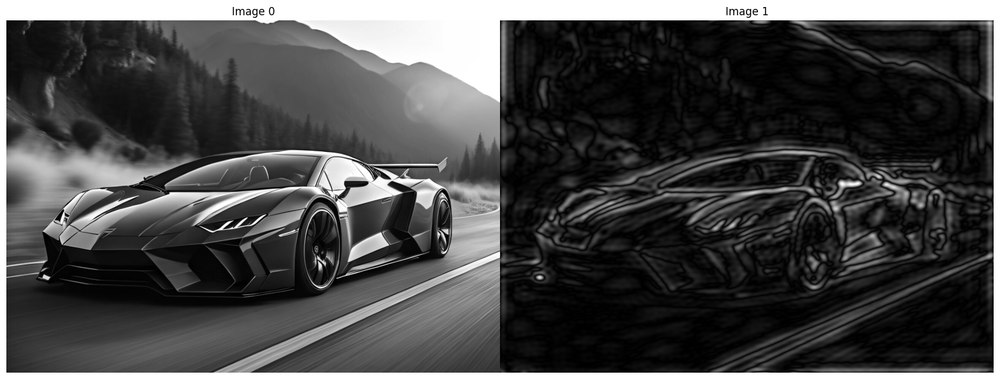

In [ ]:
def ApplyCenterCircleMaskBandPass(dft_shift, radius_small, radius_big, dim):
    """
    Apply a center circular mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        radius_small (int): Radius of the inner circle.
        radius_big (int): Additional radius for the outer circle.
        dim (int): Dimension to apply the mask (for multi-channel data).

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask with the same size as the frequency domain representation
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Create inner and outer circle masks
    mask_lowpass = mask.copy()
    mask_centralpass = mask.copy()

    # Draw circles using cv2.circle
    cv2.circle(mask_lowpass, (ccol, crow), radius_small, (1, 1), -1)  # Inner circle
    cv2.circle(mask_centralpass, (ccol, crow), radius_small + radius_big, (1, 1), -1)  # Outer circle

    # Create bandpass mask by subtracting inner circle from outer circle
    maskbandpass = mask_centralpass - mask_lowpass

    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * maskbandpass[:,:,dim]

    return masked_dft_shift, maskbandpass

# Get image dimensions
rows, cols = image_gray.shape
crow, ccol = (int)(rows/2), (int)(cols/2)

# Create mask and apply filter
image_dft_frequency_crop, maskbandpass = ApplyCenterCircleMaskBandPass(
    image_dft_frequency,
    radius_small=10,
    radius_big=50,
    dim=0
)

# Apply inverse DFT
car_inverse = InverseDFTWithMask(dft_shift, maskbandpass)

# Display results
ShowImage([maskbandpass[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, car_inverse], 1, 2)

## 3. Apply a bandreject filter to the image from question

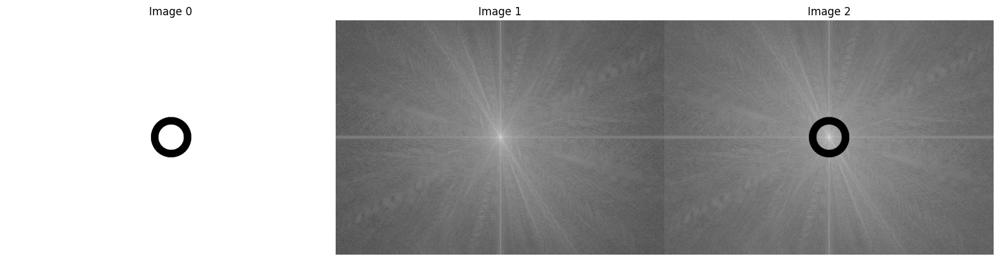

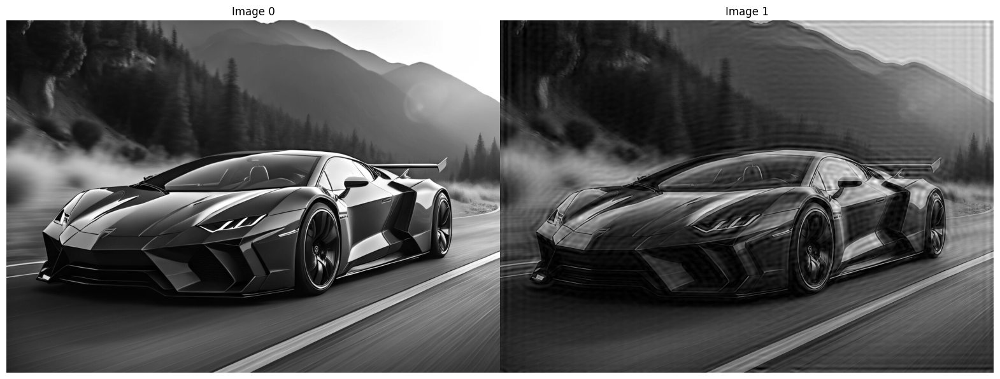

In [ ]:
def ApplyCenterCircleMaskBandReject(dft_shift, radius_small, radius_big, dim):
    """
    Apply a center circular bandreject mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        radius_small (int): Radius of the inner circle.
        radius_big (int): Additional radius for the outer circle.
        dim (int): Dimension to apply the mask (for multi-channel data).

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create masks
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask_universe = np.ones((rows, cols, 2), np.uint8)

    # Create inner and outer circle masks
    mask_lowpass = mask.copy()
    mask_centralpass = mask.copy()

    # Draw circles using cv2.circle
    cv2.circle(mask_lowpass, (ccol, crow), radius_small, (1, 1), -1)  # Inner circle
    cv2.circle(mask_centralpass, (ccol, crow), radius_small + radius_big, (1, 1), -1)  # Outer circle

    # Create bandpass mask by subtracting inner from outer
    maskbandpass = mask_centralpass - mask_lowpass

    # Create bandreject mask by inverting bandpass
    maskbandreject = mask_universe - maskbandpass

    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * maskbandreject[:,:,dim]

    return masked_dft_shift, maskbandreject

# Get image dimensions
rows, cols = image_gray.shape
crow, ccol = (int)(rows/2), (int)(cols/2)

# Create mask and apply filter
image_dft_frequency_crop, maskbandreject = ApplyCenterCircleMaskBandReject(
    image_dft_frequency,
    radius_small=50,
    radius_big=30,
    dim=0
)

# Apply inverse DFT
car_inverse = InverseDFTWithMask(dft_shift, maskbandreject)


# Display results
ShowImage([maskbandreject[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, car_inverse], 1, 2)

## 4. Perform image compression using Fourier transforms on the image from question 1.

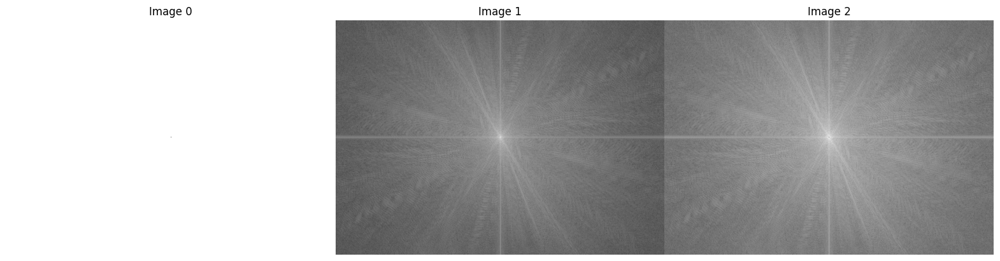

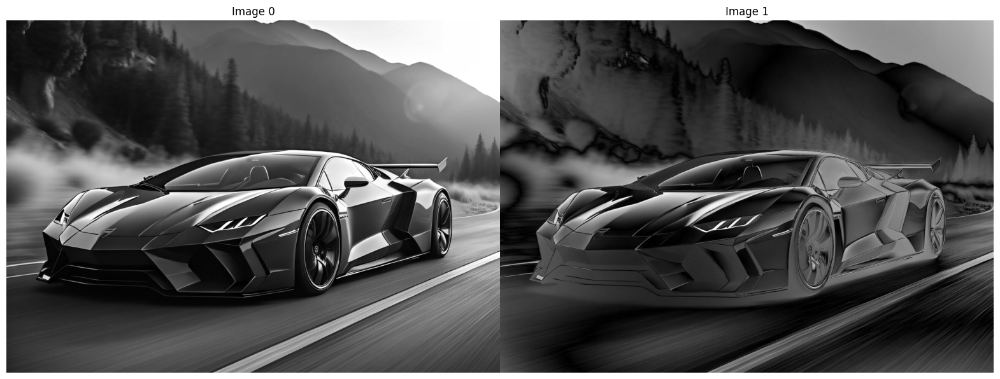

In [ ]:
def ApplyCenterCircleMask2(dft_shift, radius, dim):
    """
    Apply a center circular mask to the frequency domain representation of an image.

    Parameters:
        dft_shift (ndarray): The shifted DFT (frequency domain) representation of the image.
        radius (int): Radius of the circle mask.
        dim (int): Dimension to apply the mask (for multi-channel data).

    Returns:
        masked_dft_shift (ndarray): The frequency domain representation after applying the mask.
        mask (ndarray): The mask applied to the frequency domain representation.
    """
    # Get the dimensions of the DFT
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

    # Create a zero-filled mask
    mask = np.zeros((rows, cols, 2), np.uint8)

    # Draw circle using cv2.circle
    cv2.circle(mask, (ccol, crow), radius, (1, 1), -1)  # Filled circle

    # Invert the mask (1 - mask)
    mask = 1 - mask

    # Apply the mask to the frequency domain representation
    masked_dft_shift = dft_shift * mask[:,:,dim]

    return masked_dft_shift, mask

# Get image dimensions
rows, cols = image_gray.shape
crow, ccol = (int)(rows/2), (int)(cols/2)

# Create mask and apply filter
image_dft_frequency_crop, maskbandreject = ApplyCenterCircleMask2(
    image_dft_frequency,
    radius=1,    # Small radius for compression
    dim=0
)

# Apply inverse DFT
car_inverse = InverseDFTWithMask(dft_shift, maskbandreject)

# Display results
ShowImage([maskbandreject[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, car_inverse], 1, 2)


In [ ]:
cv2.imwrite('car_compressed_image_Fourier.jpg', car_inverse)

True

## 5. Perform image compression using wavelet transforms on the image from question 1, and compare the size with the original image and the compressed image from Fourier transform.

In [ ]:
def calculate_wavelet_coeffs(image, wavelet='bior1.3'):
    """
    Compute the wavelet coefficients using 2D Discrete Wavelet Transform (DWT2) for the input image.

    Parameters:
    - image: numpy array representing the input image.
    - wavelet: name of the wavelet to be used (default is 'bior1.3').

    Returns:
    - cA: Approximation coefficients.
    - cH: Horizontal detail coefficients.
    - cV: Vertical detail coefficients.
    - cD: Diagonal detail coefficients.
    """
    coeffs = pywt.dwt2(image, wavelet)
    cA, (cH, cV, cD) = coeffs
    return cA, cH, cV, cD

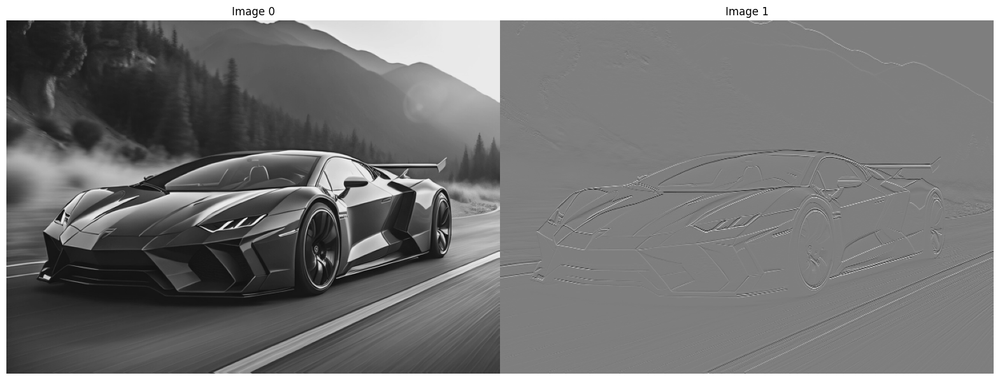

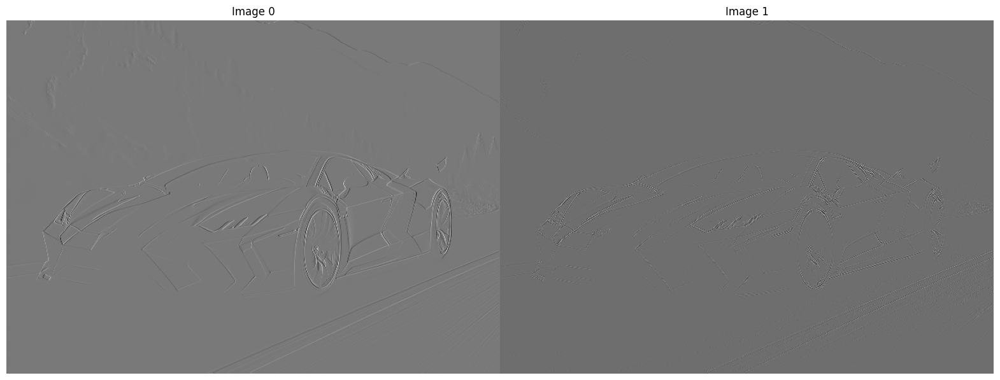

In [ ]:
cA, cH, cV, cD = calculate_wavelet_coeffs(image_gray)

ShowImage([cA, cH], 1, 2)
ShowImage([cV, cD], 1, 2)

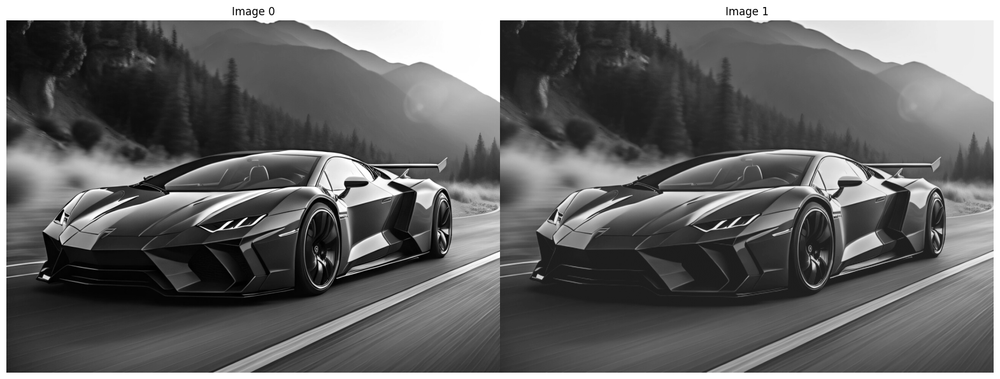

In [ ]:
compressed_image = compress_image_with_threshold(coeffs = (cA, (cH, cV, cD)), threshold = 30)
ShowImage([image_gray, compressed_image], 1, 2)

In [ ]:
cv2.imwrite('car_compressed_image_Wavelet.jpg', compressed_image)

True

In [ ]:
print(get_actual_file_size("car.jpg"))
print(get_actual_file_size("car_compressed_image_Fourier.jpg"))
print(get_actual_file_size("car_compressed_image_Wavelet.jpg"))

The actual file size is: 253.49 KB
The actual file size is: 14.48 KB
The actual file size is: 250.09 KB
